# Trajectory analysis

In [2]:
here::i_am("rna_atac/differential/RNA.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(destiny))
suppressPackageStartupMessages(library(destiny))
suppressPackageStartupMessages(library(tradeSeq))
suppressPackageStartupMessages(library(slingshot))
suppressPackageStartupMessages(library(scales))
suppressPackageStartupMessages(library(BiocParallel))
#suppressPackageStartupMessages(library(circlize))


BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [3]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

args$logFC_thr = 0.75
args$FDR_thr = 0.05

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/differential/expression/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

### Functions
# minmax normalisation 
minmax = function(x){(x-min(x))/(max(x)-min(x))}
# Reversing vector order (for pseudotime)
reverse = function(x){-x + max(x) + min(x)}

In [83]:
# Load meta
meta = fread(args$metadata)[day!='D3']

# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = meta$cell)
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

# Add UMAP to SCE
umap.mtx = meta[,c('cell', 'UMAP1', 'UMAP2')] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()

reducedDim(rna.sce, "UMAP") = umap.mtx

### Allantois Trajectory

In [84]:
# select celltypes for allantois trajectory
args$Allantois_trajectory = c('Primitive_Streak',
                              'Early_Mes_EOi', 
                              'Posterior_Mes', 
                            #  'Mesenchyme', --> this results in a lot of mesenchyme specific genes
                              'Allantois_Precursor',
                              'Allantois') 
# Tried with Endothelium but it's too different

In [85]:
# subset to trajectory
meta_al = meta[celltype_v1 %in% args$Allantois_trajectory]
sce_al = rna.sce[, meta_al$cell]


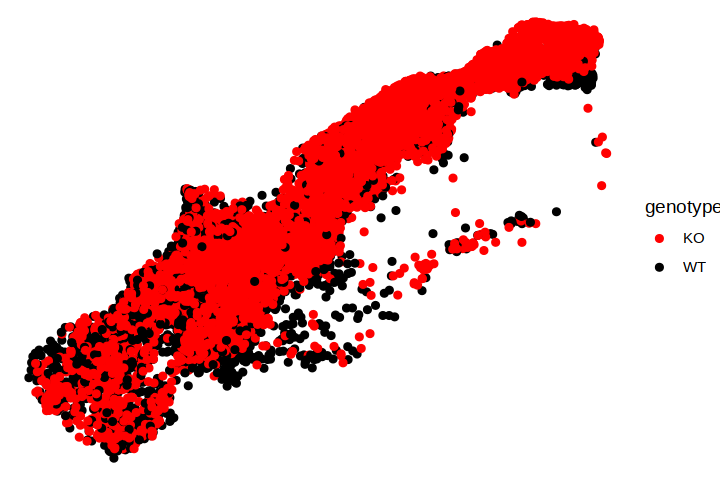

In [86]:
options(repr.plot.height=4, repr.plot.width=6)
ggplot(meta_al, aes(UMAP1, UMAP2, col=genotype)) + 
    geom_point() +
    scale_color_manual(values=opts$genotype.colors) + 
    theme_void()

In [87]:
#######################
## Feature selection ##
#######################
args$features = 2500

decomp <- modelGeneVar(sce_al)
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% 
    as.data.table(., keep.rownames=T) %>% 
     head(n=args$features) %>% .$rn

# Subset HVGs
sce_filt <- sce_al[hvgs,]
dim(sce_filt)

sce_filt <- runPCA(sce_filt, ncomponents = 15, ntop=nrow(sce_filt))

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


[1]  2500 15006

In [88]:
reducedDim(sce_al, "PCA") = reducedDim(sce_filt, "PCA")
pca = as.data.frame(reducedDim(sce_filt, "PCA"))

In [89]:
dm <- DiffusionMap(pca, n_pcs=5)
# Add to the SingleCellExperiment object
reducedDim(sce_al, "DiffusionMap") <- dm@eigenvectors[,c(1,2)]

Warning message:
“as(<dsCMatrix>, "dsTMatrix") is deprecated since Matrix 1.5-0; do as(., "TsparseMatrix") instead”


In [90]:
opts$celltype_v1.colors

Early_Mes_EOd    Primitive_Streak                  HE       Posterior_Mes 
          "#D51F26"           "#272E6A"           "#208A42"           "#89288F" 
         Mesenchyme       Early_Mes_EOi           Allantois Allantois_Precursor 
          "#F47D2B"           "#FEE500"           "#8A9FD1"           "#C06CAB" 
       HE_Precursor         Endothelium    Blood_Progenitor 
          "#E6C2DC"           "#90D5E4"           "#89C75F"

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


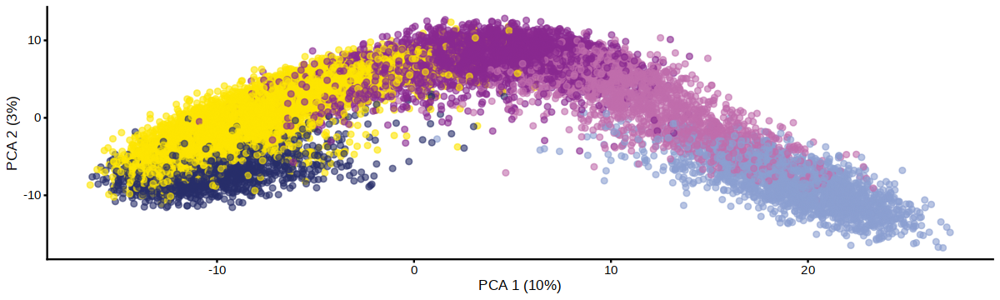

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


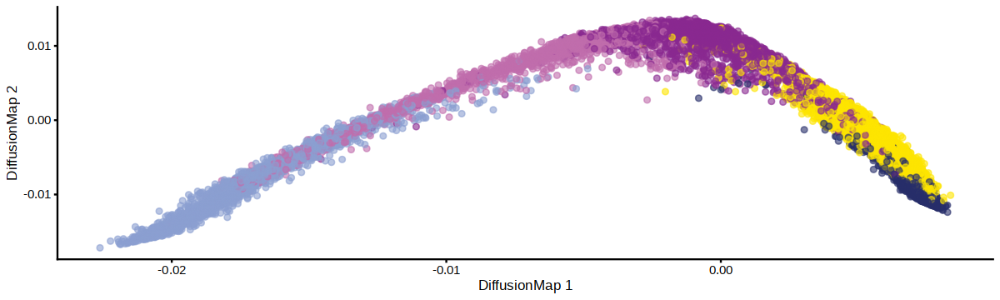

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


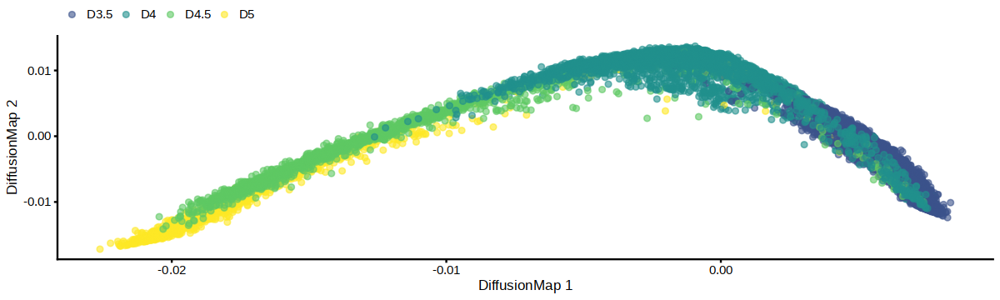

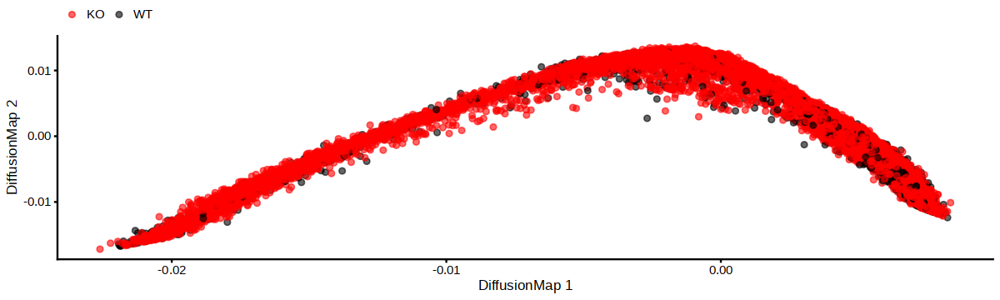

In [91]:
# Plot
options(repr.plot.width=10, repr.plot.height=3)
plotReducedDim(sce_al, dimred = "PCA", colour_by="celltype_v1", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$celltype_v1.colors) + theme(legend.position="none")

plotReducedDim(sce_al, dimred = "DiffusionMap", colour_by="celltype_v1", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$celltype_v1.colors) + theme(legend.position="none")

plotReducedDim(sce_al, dimred = "DiffusionMap", colour_by="day", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$days.colors) + theme(legend.position="top", legend.title = element_blank())

plotReducedDim(sce_al, dimred = "DiffusionMap", colour_by="genotype", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$genotype.colors) +theme(legend.position="top", legend.title = element_blank())

In [92]:
sce_al <- slingshot(sce_al, reducedDim='PCA')
head(sce_al$slingPseudotime_1)

No cluster labels provided. Continuing with one cluster.



[1] 28.45586 19.61267 17.00305 15.84553 13.73461 20.52012

In [93]:
embedded <- embedCurves(sce_al, "DiffusionMap")
embedded <- slingCurves(embedded)[[1]] # only 1 path.
embedded <- data.frame(embedded$s[embedded$ord,])

In [94]:
meta = as.data.table(colData(sce_al)[,-grep('slingshot', colnames(colData(sce_al)))], keep.rownames=T) %>% setnames('rn', 'cell') %>% 
  #  .[, pseudotime := reverse(slingPseudotime_1)]
  #  .[, pseudotime := minmax(slingPseudotime_1) * 100]
    .[, pseudotime := slingPseudotime_1]

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


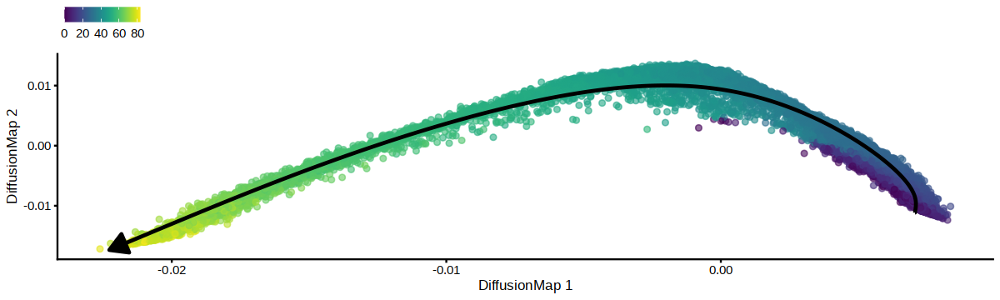

In [95]:
colData(sce_al)$pseudotime = meta$pseudotime # meta %>% tibble::column_to_rownames("cell") %>% DataFrame

plotReducedDim(sce_al, dimred = "DiffusionMap", colour_by="pseudotime", ncomponents = c(1,2)) +
    geom_path(data=embedded, 
              aes(x=DC1, y=DC2), 
              size=1, 
              arrow=grid::arrow(ends = 'last', type = 'closed', length = unit(0.20, "inches"))) + 
    theme(legend.position="top", legend.title = element_blank())

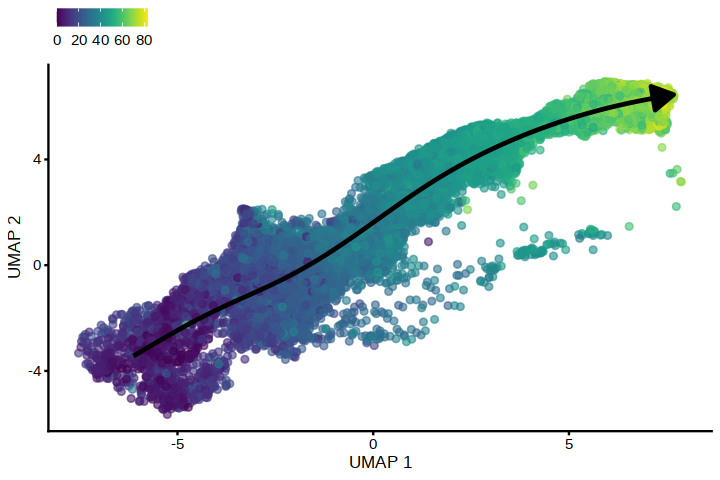

In [96]:
# Check on UMAP
# Mesenchyme being incorporated might bias results, might try excluding cells that deviate too much like in ArchR?
embedded <- embedCurves(sce_al, "UMAP")
embedded <- slingCurves(embedded)[[1]] # only 1 path.
embedded <- data.frame(embedded$s[embedded$ord,])

options(repr.plot.height=4, repr.plot.width=6)
plotReducedDim(sce_al, dimred = "UMAP", colour_by="pseudotime", ncomponents = c(1,2)) +
    geom_path(data=embedded, 
              aes(x=UMAP1, y=UMAP2), 
              size=1, 
              arrow=grid::arrow(ends = 'last', type = 'closed', length = unit(0.20, "inches"))) + 
    theme(legend.position="top", legend.title = element_blank())

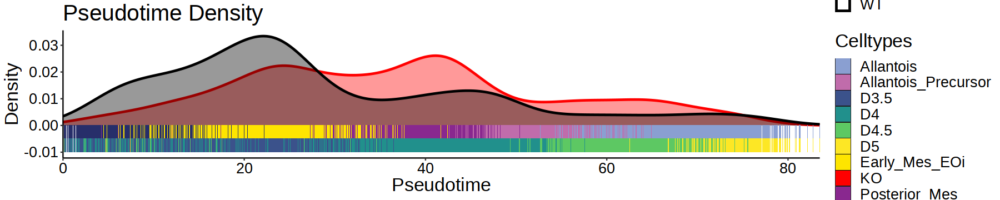

In [97]:
options(repr.plot.height=3, repr.plot.width=15)

ggplot(meta, aes(pseudotime)) + 
    geom_density(alpha=0.4, size=1, aes(col=genotype, fill=genotype)) + 
    geom_rect(aes(xmin = pseudotime - 0.0001, xmax = pseudotime + 0.0001,
                  ymin = -0.005, ymax = 0, fill=celltype_v1)) + 
    geom_rect(aes(xmin = pseudotime - 0.0001, xmax = pseudotime + 0.0001,
                  ymin = -0.01, ymax = -0.005, fill=day)) + 
    scale_colour_manual(values= c(opts$genotype.colors), name='Genotype') + 
    scale_fill_manual(values = c(opts$genotype.colors, opts$celltype_v1.colors, opts$days.colors), name='Celltypes') +
    scale_x_continuous(expand = c(0, 0)) +
    ggtitle('Pseudotime Density') + 
    xlab('Pseudotime') + ylab('Density') + 
    theme_classic() + 
    theme(text = element_text(size=20),
          axis.text = element_text(color='black'))

In [98]:
saveRDS(sce_al, sprintf('%s/sce_al.rds', args$outdir))

# Trade-seq

In [24]:
args$groupA = 'WT'
args$groupB = 'KO'
opts$groups = c(args$groupA, args$groupB)

In [29]:
# Min values set very low to keep genes that are very specific
min.cdr = 0.05
min.expr = 0.05

expr.dt <- data.table(
    gene = rownames(rna.sce),
    mean_groupA = rowMeans(logcounts(sce_al[,sce_al$genotype == args$groupA])) %>% round(2),
    mean_groupB = rowMeans(logcounts(sce_al[,sce_al$genotype == args$groupB])) %>% round(2),
    cdr_groupA = rowMeans(logcounts(sce_al[,sce_al$genotype == args$groupA])>0) %>% round(2),
    cdr_groupB = rowMeans(logcounts(sce_al[,sce_al$genotype == args$groupB])>0) %>% round(2)
)

#######################
## Feature selection ##
#######################
# filter genes
genes.to.use <- expr.dt[mean_groupA>=min.expr | mean_groupB>=min.expr,][cdr_groupA>=min.cdr | cdr_groupB>=min.cdr,gene]
genes.to.use = genes.to.use[!genes.to.use %in% genes.to.use[grep("*Rik|^Gm|^Rps|^Rpl|^Olfr", genes.to.use)]]  
length(genes.to.use)

[1] 11008

In [26]:
sce_filt = sce_al[genes.to.use,]

In [20]:
# Set parallel cores
BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 12

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 4.1 GiB”
Fitting lineages with multiple conditions. This method has been tested on a couple of datasets, but is still in an experimental phase.

Fitting lineages with multiple conditions. This method has been tested on a couple of datasets, but is still in an experimental phase.

Fitting lineages with multiple conditions. This method has been tested on a couple of datasets, but is still in an experimental phase.

Fitting lineages with multiple conditions. This method has been tested on a couple of datasets, but is still in an experimental phase.

Fitting lineages with multiple conditions. This method has been tested on a couple of datasets, but is still in an experimental phase.

Fitting lineages with multiple conditions. This method has been tested on a couple of datasets, but is still in an experimental phase.



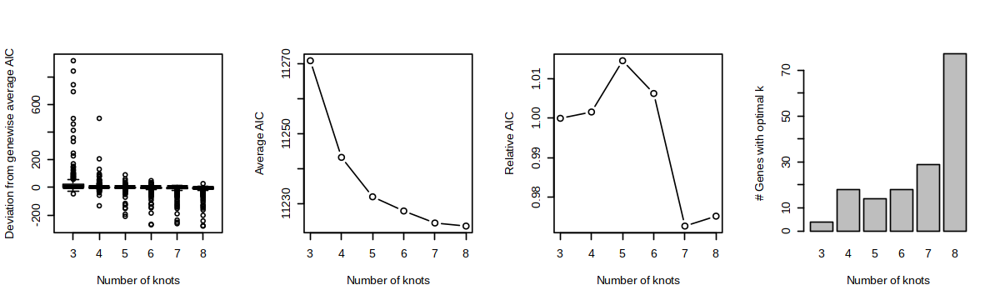

In [209]:
options(repr.plot.width = 10, repr.plot.height=3)
icMat <- evaluateK(counts = as.matrix(assays(sce_filt)$counts),
                   pseudotime = sce_filt$pseudotime,
                   cellWeights = rep(1,ncol(sce_filt)),
                   conditions = factor(colData(sce_filt)$genotype),
                   nGenes = 300,
                   parallel = TRUE,
                   BPPARAM=BPPARAM,
                   k = 3:8,
                   verbose = FALSE)

In [28]:
### Run in Rscript

# # Set all cells to belong to one trajectory
# cellWeights <- rep(1,ncol(sce_filt))

# # create a model matrix -> Comparing within Embryo pools
# U <- model.matrix(~sce_filt$replicate)

# sceGAM <- fitGAM(counts = counts(sce_filt),
#                  conditions = factor(sce_filt$genotype, levels=c('KO', 'WT')),
#                  U = U,
#                  pseudotime= sce_filt$pseudotime,
#                  cellWeights=cellWeights,
#                  nknots=8, 
#                  parallel = TRUE,
#                  BPPARAM=BPPARAM,
#                  verbose=F)

# saveRDS(sceGAM, paste0(io$outdir,"/sceGAM_v1.rds"))

In [4]:
sceGAM = readRDS(paste0(args$outdir,"/sceGAM_v1.rds"))
sce_al = readRDS(sprintf('%s/sce_al.rds', args$outdir))

In [5]:
# Differential testing

args$logFC_thr = 0.75
args$FDR_thr = 0.05

condRes <- conditionTest(sceGAM, l2fc = args$logFC_thr)
condRes$padj <- p.adjust(condRes$pvalue, "fdr")

In [6]:
condRes = condRes %>% as.data.table(keep.rownames=T) %>%
    setnames('rn', 'gene') %>%
    .[,sig:=ifelse(padj<=args$FDR_thr, TRUE, FALSE)] %>%
    .[order(padj, -waldStat)]

In [11]:
unique(sce_al$genotype)

[1] "WT" "KO"

In [9]:
plot_traj = function(gene, size=0.1, alpha=0.1){
    ggplot(as.data.frame(colData(sce_al)[,-grep('slingshot', colnames(colData(sce_al)))]), aes(pseudotime, as.vector(logcounts(sce_al[gene,])), col=genotype)) + 
        geom_point(size=size, alpha=alpha) + 
        geom_smooth() + 
        scale_colour_manual(values=c('KO'='red', 'WT'='black'), name='genotype') + 
        ylab('logcounts') + 
        xlab('Pseudotime') + 
        ggtitle(gene) + 
        theme_bw() + 
        theme(text=element_text(size=20))
}

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


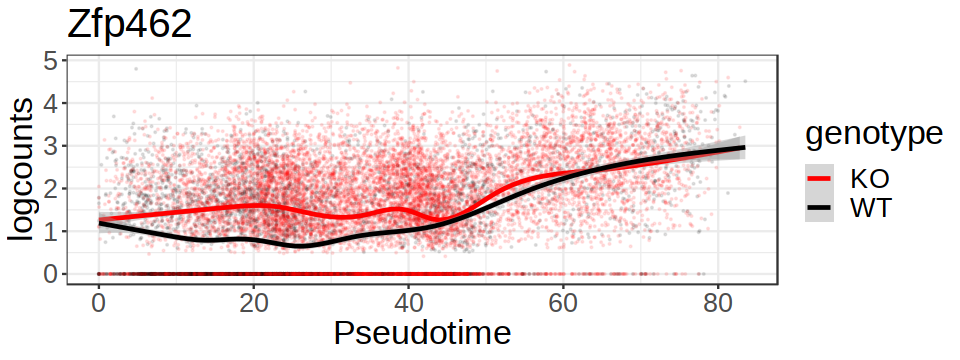

In [14]:
options(repr.plot.height=3, repr.plot.width=8)
plot_traj('Zfp462')

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


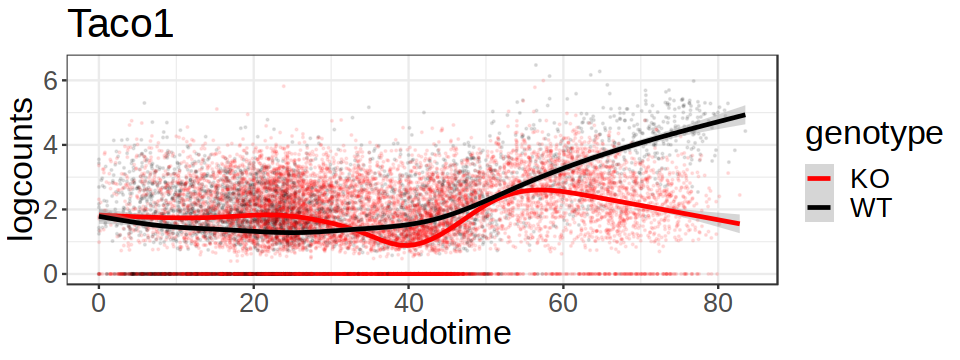

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


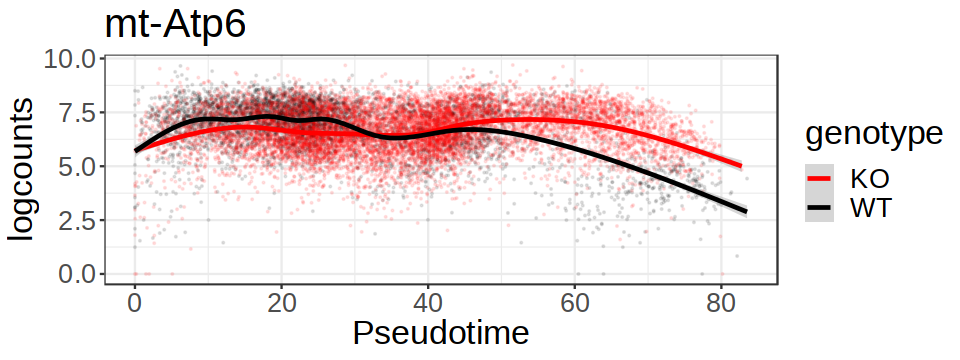

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


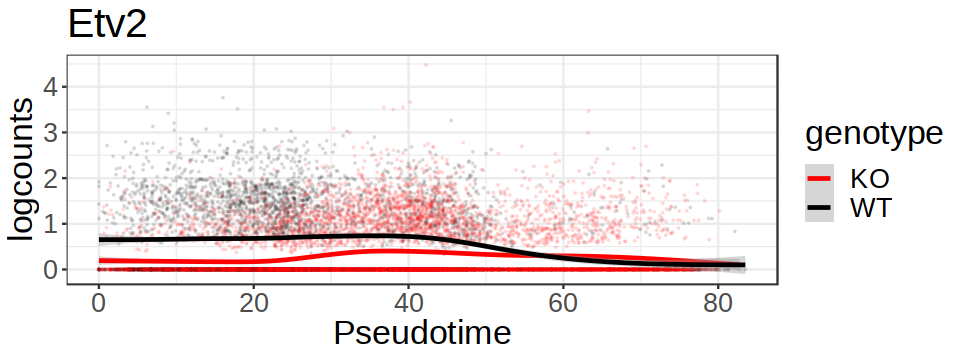

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'


[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


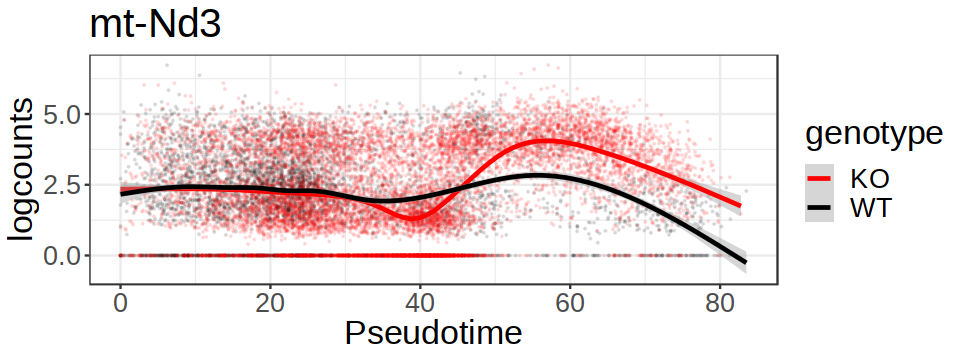

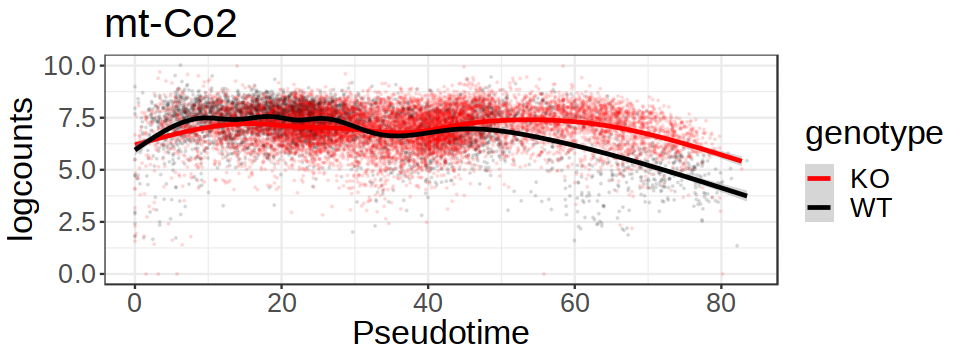

In [15]:
mclapply(head(condRes$gene, 5), plot_traj, mc.cores=24)

In [16]:
trans <- div_gradient_pal(low='#5a77ff', mid='lightyellow', high='#d66468')
cols <- trans(seq(0,1, length.out=20))

In [21]:
suppressPackageStartupMessages(library(circlize))
suppressPackageStartupMessages(library(ComplexHeatmap))

In [22]:
col_fun = colorRamp2(seq(0, 50, 5), viridis::viridis(length(seq(0, 50, 5))))

In [23]:
ha = HeatmapAnnotation(pseudotime = 1:50,
                       col = list(pseudotime = col_fun))

In [24]:
length(condRes[sig==TRUE, gene])

[1] 161

In [38]:
conditionGenes = condRes[sig==TRUE, gene] # head(condRes[sig==TRUE, gene], 100)

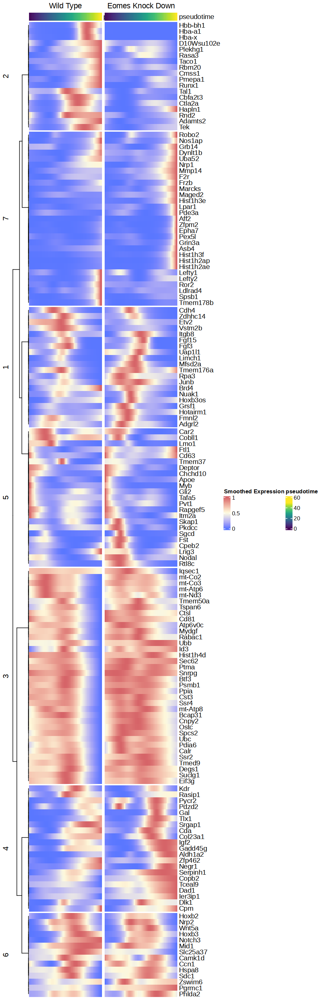

In [52]:
yhatSmooth <- predictSmooth(sceGAM, gene = conditionGenes, nPoints = 50, tidy = FALSE)
yhatSmooth_minmax = t(apply(yhatSmooth, 1, minmax)) 
WT = yhatSmooth_minmax[, grepl('WT', colnames(yhatSmooth_minmax))]
KO = yhatSmooth_minmax[, grepl('KO', colnames(yhatSmooth_minmax))]

# Clustering
k = 7
group = kmeans(yhatSmooth_minmax, centers = k)$cluster
row_clust = cluster_within_group(t(yhatSmooth_minmax), group)

hm_list = Heatmap(WT, 
                  cluster_rows = row_clust,
                  cluster_columns = FALSE,
                  column_title = 'Wild Type',
                  show_column_names  = FALSE,
                  row_split = k,
                  #row_split = as.data.frame(group), 
                  #km = 6,
                  col = cols,
                  heatmap_legend_param = list(title = 'Smoothed Expression'), 
                  top_annotation = ha) + 
          Heatmap(KO, 
                  cluster_columns = FALSE, 
                  column_title = 'Eomes Knock Down',
                  show_column_names  = FALSE,
                  col = cols,
                  show_heatmap_legend = F, 
                  top_annotation = ha)
options(repr.plot.height=25, repr.plot.width=8)
draw(hm_list)

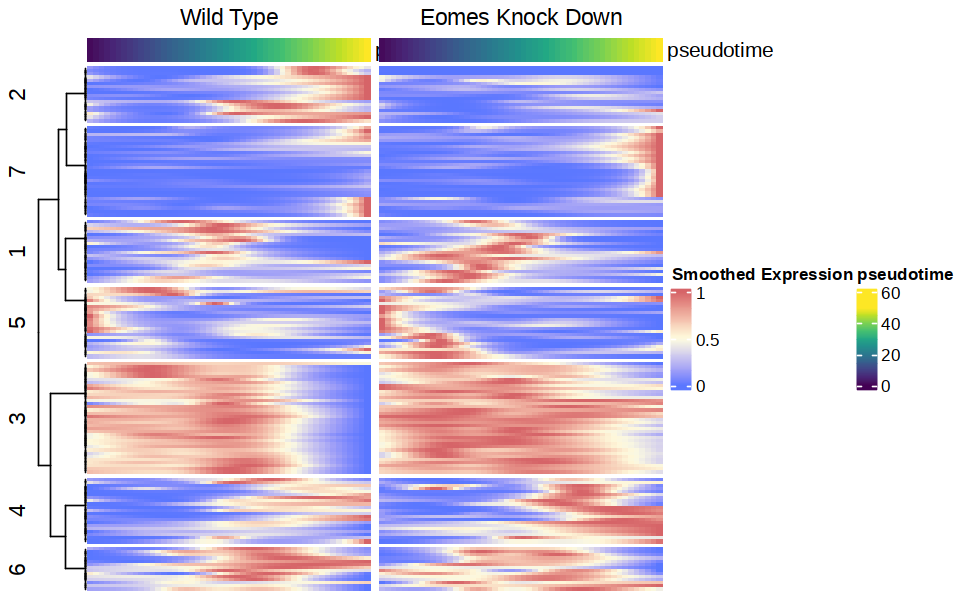

In [53]:
hm_list = Heatmap(WT, 
                  cluster_rows = row_clust,
                  cluster_columns = FALSE,
                  column_title = 'Wild Type',
                  show_column_names  = FALSE,
                  row_split = k,
                  #row_split = as.data.frame(group), 
                  #km = 6,
                  col = cols,
                  heatmap_legend_param = list(title = 'Smoothed Expression'), 
                  top_annotation = ha) + 
          Heatmap(KO, 
                  cluster_columns = FALSE, 
                  column_title = 'Eomes Knock Down',
                  show_column_names  = FALSE,
                  show_row_names  = FALSE,
                  col = cols,
                  show_heatmap_legend = F, 
                  top_annotation = ha)

options(repr.plot.height=5, repr.plot.width=8)
draw(hm_list)

In [64]:
names(group[group==3])

[1] "mt-Atp6"  "mt-Nd3"   "mt-Co2"   "mt-Co3"   "mt-Atp8"  "Ubb"     
 [7] "Pdia6"    "Ssr2"     "Ctsl"     "Tmed9"    "Iqsec1"   "Calr"    
[13] "Tmem50a"  "Cnpy2"    "Id3"      "Atp6v0c"  "Tspan6"   "Cst3"    
[19] "Hist1h4d" "Degs1"    "Ptma"     "Btf3"     "Ostc"     "Mydgf"   
[25] "Suclg1"   "Eif3g"    "Spcs2"    "Sec62"    "Snrpg"    "Rabac1"  
[31] "Bcap31"   "Psmb1"    "Ubc"      "Ssr4"     "Ppia"     "Cd81"

In [54]:
# Now combine clusters together in a single plot
smooth.dt = as.data.table(yhatSmooth_minmax, keep.rownames=T) %>% 
    setnames('rn', 'gene') %>% 
    melt(., id.vars = 'gene', variable.names = 'column', value.names= 'value') %>%
    .[,genotype := ifelse(grepl('KO', variable), 'Eomes KD', 'WT')] %>%
    .[,genotype := factor(genotype, levels=c('WT', 'Eomes KD'))] %>%
    .[,pseudotime := as.numeric(gsub('point', '', str_split(variable, '_') %>% map_chr(3)))] %>% 
    merge(., 
          as.data.table(group, keep.rownames=T) %>% setnames('rn', 'gene'),
          by='gene') 

mean.dt = smooth.dt %>% copy() %>% 
    .[,value := mean(value), by=c('group', 'genotype', 'pseudotime')] %>% 
    unique(by=c('group', 'genotype', 'pseudotime'))

nrow(smooth.dt)
nrow(mean.dt)

[1] 16100

[1] 700

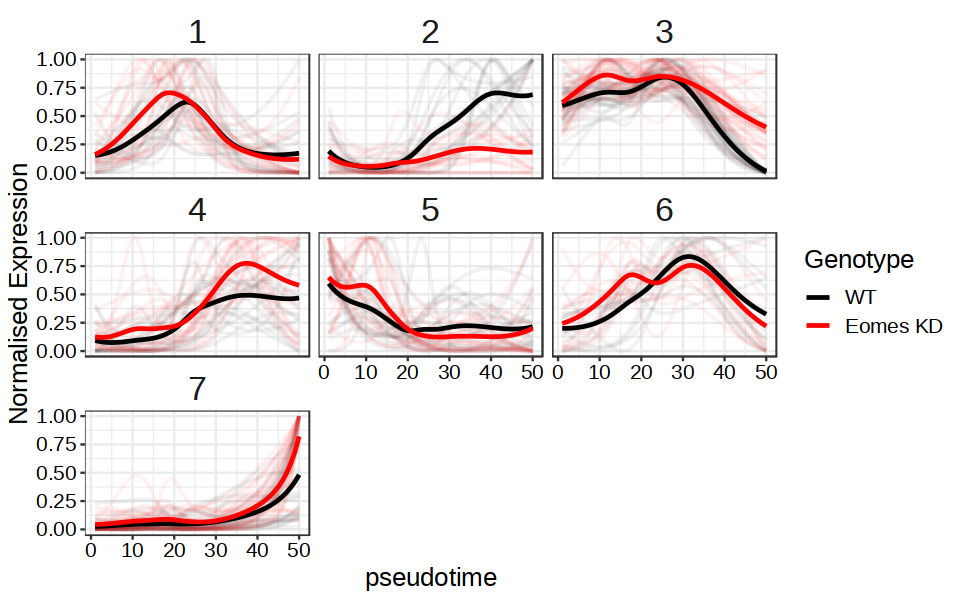

In [55]:
options(repr.plot.height=5, repr.plot.width=8)
ggplot(smooth.dt, aes(pseudotime, value, col=genotype, group.by=gene)) + 
    geom_line(alpha=0.05, size=0.8) +
    geom_line(data=mean.dt, size=1) + 
    scale_color_manual(values=c('WT' = 'black', 'Eomes KD' = 'red'), name='Genotype') + 
    facet_wrap(~group) + 
    ylab('Normalised Expression') + 
    theme_bw() + 
    theme(strip.background=element_blank(),
          strip.text = element_text(size=20), 
         text = element_text(size=15, color='black'),
         axis.text = element_text(color='black'))

In [56]:
genes = names(group)
options(repr.plot.width = 15, repr.plot.height=30)
plots = mclapply(genes, function(x){
        p = plot_traj(x, size=0.01, alpha=0.1) + 
                scale_x_continuous(breaks = seq(0, 50, by = 25)) + 
                theme(axis.title=element_blank(),
                      axis.text.x=element_text(color='black'),
                      axis.text.y=element_text(color='black'))
        return(p)
    }, mc.cores=24) 
p = ggarrange(plotlist=plots, nrow=10, ncol=5, common.legend=TRUE, legend="right")

`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 'y ~ s(x, bs = "cs")'
`geom_smooth()` using method = 'gam' and formula = 

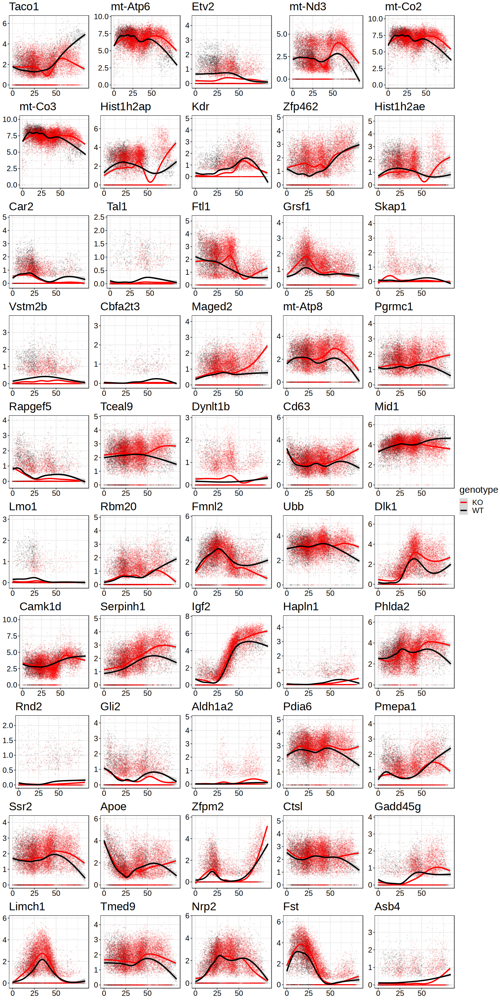

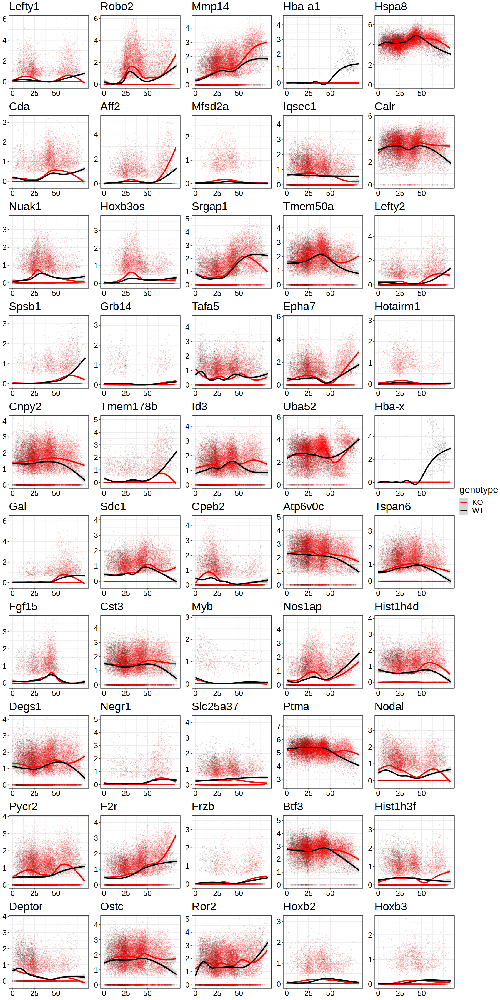

$`1`

$`2`

$`3`

$`4`

attr(,"class")
[1] "list"      "ggarrange"

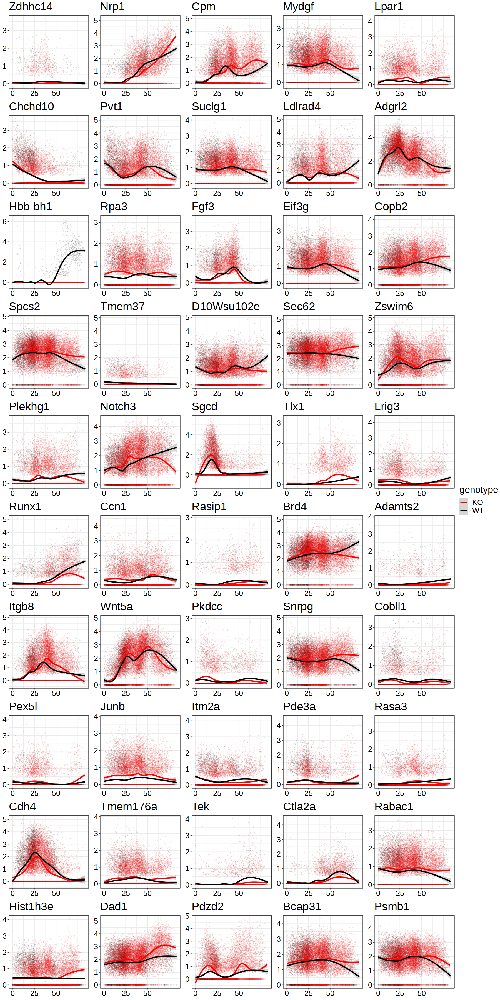

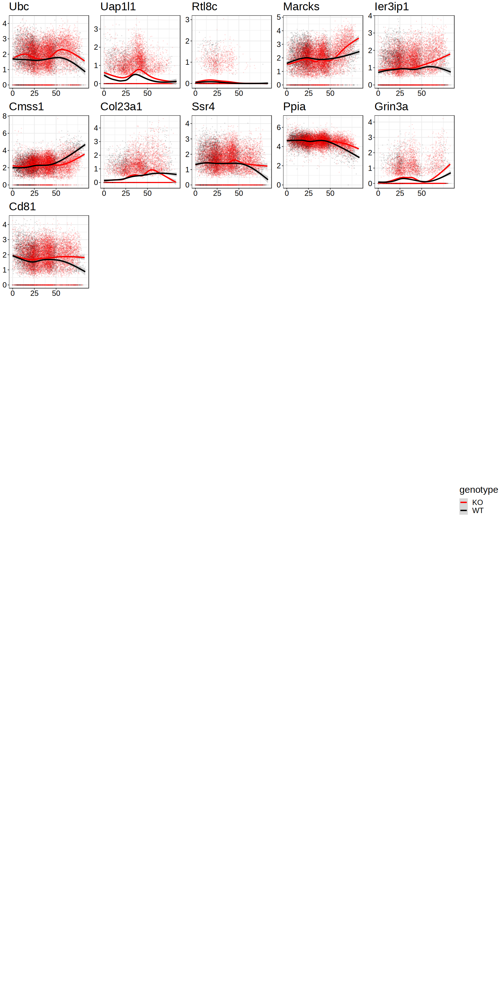

In [57]:
p